In [1]:
# Utils
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt

import numpy as np
import time
#import _pickle as pickle
import pickle
import re, sys, unidecode
#import unidecode

# Representation
import nltk
from nltk.corpus import stopwords
import scikitplot.plotters as skplt

plt.style.use('fivethirtyeight')


/root/anaconda3/lib/python3.6/site-packages/tensorflow/python/_pywrap_tensorflow_internal.so | _pywrap_tensorflow_internal


# Load Data

In [3]:
root_path = "../"
path_data_raw = root_path + "data/raw/"
dfNoticias = pd.read_pickle(path_data_raw+"dfNoticias")

# Data info

In [7]:
dfNoticias.head()

,Cuerpo,Fecha,Hora,ID,Resumen,Seccion_1,Seccion_2,Seccion_3,Subtema_1,Subtema_2,Subtema_3,Tema_1,Tema_2,Tema_3,Titular,Type
1,\nMarcel Granollers (44°) sorprendió a David F...,20140929,09:57,20140929095927,\nEl español cayó ante su compatriota Marcel G...,Deportes,None,None,Torneos ATP,None,None,Tenis,None,None,\nDavid Ferrer sufrió otra temprana eliminación\n,fid_noticia
2,\nEl Gobierno de Barack Obama ha enviado cuatr...,20140929,07:03,20140929065051,\nLas conversaciones comenzaron el año 2010 y ...,País,Mundo,Mundo,EE.UU.,Relaciones Exteriores,None,Relaciones Exteriores,EE.UU.,Cuba,\nObama ha enviado cuatro solicitudes a Chile ...,fid_noticia
3,\nEste miércoles la Comisión Asesora Presidenc...,20140929,11:37,20140929105234,\nRepresentantes del sector privado acusaron q...,País,None,None,Isapre,None,None,Salud,None,None,\nQuiebre en comisión presidencial de isapres ...,fid_noticia
4,"\nWolfgang Burmann, del Team Avanti, se adjudi...",20140929,10:05,20140929100825,\nEl pedalero del equipo Avanti terminó en el ...,Deportes,None,None,Chilenos,None,None,Ciclismo,None,None,\nWolfgang Burmann ganó el segundo clasificato...,fid_noticia
5,"\nWolfgang Burmann, del Team Avanti, se adjudi...",20140929,10:05,20140929130450,\nEl pedalero del equipo Avanti terminó en el ...,Deportes,None,None,Chilenos,None,None,Ciclismo,None,None,\nWolfgang Burmann ganó el segundo clasificato...,fid_noticia


In [19]:
dfNoticias.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 250759 entries, 1 to 389889
Data columns (total 16 columns):
Cuerpo       250639 non-null object
Fecha        250759 non-null object
Hora         250759 non-null object
ID           250759 non-null object
Resumen      249632 non-null object
Seccion_1    250459 non-null object
Seccion_2    123240 non-null object
Seccion_3    37532 non-null object
Subtema_1    182753 non-null object
Subtema_2    74385 non-null object
Subtema_3    24247 non-null object
Tema_1       248508 non-null object
Tema_2       116973 non-null object
Tema_3       36153 non-null object
Titular      250759 non-null object
Type         250759 non-null object
dtypes: object(16)
memory usage: 32.5+ MB


### elementos nulos

Existen noticias con el cuerpo en nulo, primeras en ser borradas.
Tambien con seccion_1 en nulo, borrar tambien.

In [21]:
pd.isnull(dfNoticias).any()

Cuerpo        True
Fecha        False
Hora         False
ID           False
Resumen       True
Seccion_1     True
Seccion_2     True
Seccion_3     True
Subtema_1     True
Subtema_2     True
Subtema_3     True
Tema_1        True
Tema_2        True
Tema_3        True
Titular      False
Type         False
dtype: bool

### Cantidades totales por cada columnas, cantidad de elementos no repetidos, elemento mas repetido y la cantidad de veces que se repite este

Aca se pueden ver las cantidades de noticias etiquetadas y la cantidad de etiquetas, para seccionx, temax y subtemaX

620 noticias con cuerpo repetido, "/n/n", borrar tambien.

In [16]:
dfNoticias.describe(include="all")

,Cuerpo,Fecha,Hora,ID,Resumen,Seccion_1,Seccion_2,Seccion_3,Subtema_1,Subtema_2,Subtema_3,Tema_1,Tema_2,Tema_3,Titular,Type
count,250639,250759,250759,250759,249632,250459,123240,37532,182753,74385,24247,248508,116973,36153,250759,250759
unique,238968,2171,1416,250759,236300,9,10,9,1481,1270,902,237,237,219,239031,1
top,\n\n,20110831,00:01,20150425082036,\n\n,Deportes,Deportes,Deportes,Colo Colo,Selección chilena,Chilenos en el exterior,Fútbol,Fútbol,Fútbol,\nEstrenos de cine\n,fid_noticia
freq,620,183,924,1,1206,80576,58249,20668,3312,2114,1076,43438,35295,14165,36,250759


### Ejemplo texto de una noticia
Falta limpar caracteres como /n

In [53]:
dfNoticias["Cuerpo"].iloc[100]

'\nLa serie de televisión "Miami Vice" cumple 30 años, y desde su creación ha sido considerada la plataforma que dio a conocer ante el mundo a esta glamourosa ciudad del sureste de Estados Unidos y que también la ayudó a resurgir.\nCon una trama que combinó la moda y los lujosos convertibles, yates y hoteles con problemas de tráfico de cocaína y prostitución, la cadena NBC dio a conocer esta ciudad de Florida que durante los años ochenta estaba en decadencia.\n"Miami Vice fue un show increíble, porque cambió completamente la imagen de Miami en el mundo", dijo recientemente el conocido productor musical cubanoamericano Emilio Estefan, quien hace eco del impacto que ha tenido la serie en la arquitectura, la moda y el diseño de la ciudad durante las últimas tres décadas.\nLa serie, que se transmitió durante más de 5 años, a partir de septiembre de 1984, ha tenido desde entonces una gran influencia que ha perdurado como todo un fenómeno de la cultura pop estadounidense.\nVestidos de forma 

In [45]:
def plot_class_distribution(labels):
    """Plots the class distribution.
    # Arguments
        labels: list, label values.
            There should be at lease one sample for values in the
            range (0, num_classes -1)
    """
    num_classes = 9
    count_map = Counter(labels)
    counts = [count_map[i] for i in range(num_classes)]
    idx = np.arange(num_classes)
    plt.bar(idx, counts, width=0.8, color='b')
    plt.xlabel('Class')
    plt.ylabel('Number of samples')
    plt.title('Class distribution')
    plt.xticks(idx, idx)
    plt.show()

# Analisis Etiquetas

In [46]:
plot_class_distribution(dfNoticias["Seccion_1"].values)

NameError: name 'Counter' is not defined

In [40]:
dfNoticias.loc[dfNoticias['Seccion_1'] == 'Deportes']


,Cuerpo,Fecha,Hora,ID,Resumen,Seccion_1,Seccion_2,Seccion_3,Subtema_1,Subtema_2,Subtema_3,Tema_1,Tema_2,Tema_3,Titular,Type
1,\nMarcel Granollers (44°) sorprendió a David F...,20140929,09:57,20140929095927,\nEl español cayó ante su compatriota Marcel G...,Deportes,None,None,Torneos ATP,None,None,Tenis,None,None,\nDavid Ferrer sufrió otra temprana eliminación\n,fid_noticia
4,"\nWolfgang Burmann, del Team Avanti, se adjudi...",20140929,10:05,20140929100825,\nEl pedalero del equipo Avanti terminó en el ...,Deportes,None,None,Chilenos,None,None,Ciclismo,None,None,\nWolfgang Burmann ganó el segundo clasificato...,fid_noticia
5,"\nWolfgang Burmann, del Team Avanti, se adjudi...",20140929,10:05,20140929130450,\nEl pedalero del equipo Avanti terminó en el ...,Deportes,None,None,Chilenos,None,None,Ciclismo,None,None,\nWolfgang Burmann ganó el segundo clasificato...,fid_noticia
7,"\nEl volante chileno Felipe Gutiérrez, quien s...",20140929,11:26,20140929112638,\nEl nacional debe estar entre seis y ocho mes...,Deportes,Deportes,None,Chilenos en el exterior,None,None,Fútbol,Fútbol,None,\nFelipe Gutiérrez realizará parte de su trata...,fid_noticia
13,\nEl mediocampista chileno Cristóbal Jorquera ...,20140929,16:06,20140929160741,\nEl chileno jugó 65 minutos en la caída ante ...,Deportes,Deportes,None,Liga italiana,Chilenos en el exterior,None,Fútbol,Fútbol,None,\nCristóbal Jorquera sufrió en cancha nueva de...,fid_noticia
15,\nGonzalo Lama y Christian Garín experimentaro...,20140929,07:48,20140929075028,\nHans Podlipnik bajó y Nicolás Jarry se mantu...,Deportes,Deportes,None,Chilenos,Torneos ATP,None,Tenis,Tenis,None,\nGonzalo Lama y Christian Garín tuvieron leve...,fid_noticia
20,\nEste martes Huachipato visita a Sao Paulo po...,20140929,21:26,20140929212400,"\nAdemás, el defensor Antonio Carlos se perder...",Deportes,Deportes,None,Copa Sudamericana,Huachipato,None,Fútbol,Fútbol,None,\nSao Paulo dará descanso a Kaká y Ganso ante ...,fid_noticia
25,\nLa ANFP entregó los números que dejó la nove...,20140929,17:27,20140929165540,"\nEl encuentro entre ""albos"" y Ñublense fue el...",Deportes,Deportes,Deportes,Colo Colo,None,ANFP,Fútbol,Torneo de Apertura,Fútbol,\nColo Colo fue el equipo con mejor asistencia...,fid_noticia
26,\nLa ANFP entregó los números que dejó la nove...,20140929,17:27,20140929080233,"\nEl encuentro entre ""albos"" y Ñublense fue el...",Deportes,Deportes,Deportes,Colo Colo,None,ANFP,Fútbol,Torneo de Apertura,Fútbol,\nColo Colo fue el equipo con mejor asistencia...,fid_noticia
36,\nJorge Aguilar (397º de la ATP) debutó con un...,20140929,13:02,20140929130237,\nEl 397 del mundo se impuso en el arranque de...,Deportes,Deportes,None,Chilenos,Futuros,None,Tenis,Tenis,None,\nJorge Aguilar derribó a Bastián Malla en el ...,fid_noticia


# Info labels

In [149]:
def labels_info(labels_name):
    labels_count=dfNoticias[labels_name].value_counts(ascending=True)
    total = len(labels_count)
    labels_count.plot.barh(color='DarkOrange',
                           figsize=(10,round(total/2)),
                           title="Labels " + labels_name + ", total "+ str(total),
                           grid=True)


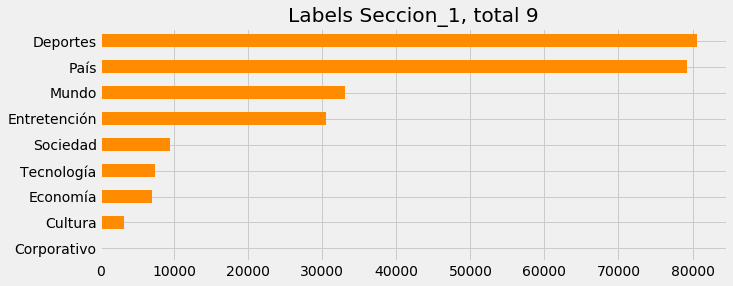

In [150]:
labels_info("Seccion_1")


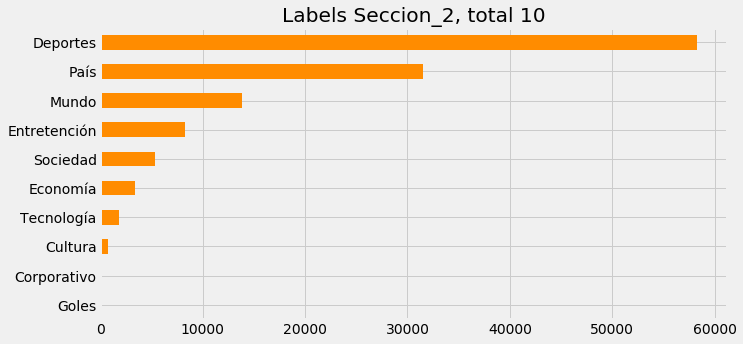

In [151]:
labels_info("Seccion_2")


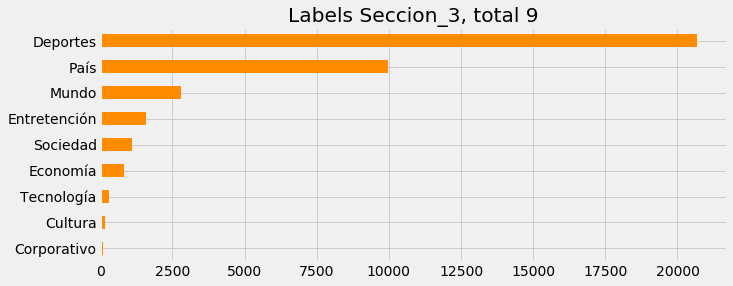

In [152]:
labels_info("Seccion_3")


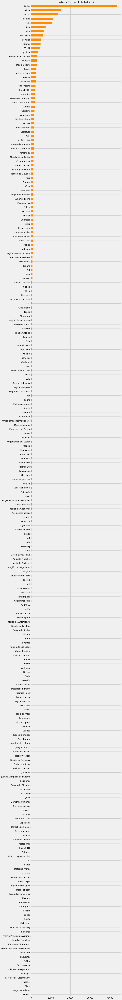

In [153]:
labels_info("Tema_1")


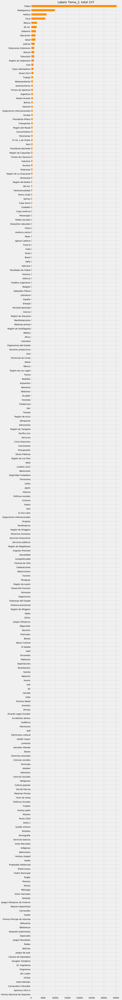

In [154]:
labels_info("Tema_2")


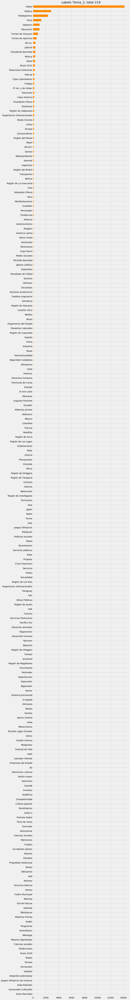

In [155]:
labels_info("Tema_3")


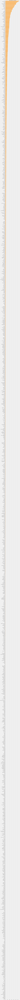

In [156]:
labels_info("Subtema_1")


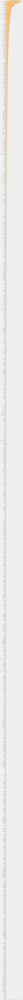

In [158]:
labels_info("Subtema_2")


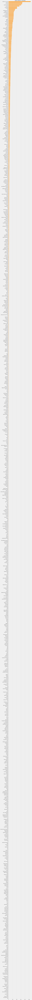

In [157]:
labels_info("Subtema_3")


# Cleaning

Limpieza de datos